# TRABAJO PRÁCTICO INTEGRADOR N°1

## Sistema de Análisis de Documentos Digitalizados

---

**Información del Estudiante:**
- **Nombre y Apellido:** Iair Ezequiel Mejias
- **Fecha de Entrega:** 24 de Septiembre de 2025
- **Materia:** Procesamiento de Imágenes - IFTS24

---

### Objetivo

Desarrollar un sistema básico de análisis automático de documentos digitalizados que integre las técnicas de procesamiento de imágenes estudiadas en el curso.

### Estructura del Trabajo

| Parte | Descripción | Peso |
|-------|-------------|------|
| **1** | Fundamentos Teóricos | 20% |
| **2** | Setup del Entorno | 15% |
| **3** | Análisis de Imágenes | 35% |
| **4** | Preprocessing Básico | 30% |

**Dataset requerido:** 3 imágenes de documentos con diferentes características (buena calidad, rotada, con problemas de iluminación)

---

# PARTE 1: Fundamentos Teóricos

## ¿Por qué Cuadernos Interactivos para IA y Ciencias de Datos?

### Diferencias Metodológicas Fundamentales

El trabajo en inteligencia artificial y ciencias de datos requiere un enfoque metodológico diferente al desarrollo de software tradicional. Mientras que la programación tradicional sigue un flujo lineal y predecible, el trabajo con datos es inherentemente iterativo y exploratorio.

**Programación Tradicional:**
```
Requisitos → Diseño → Implementación → Testing → Producto
```

**Investigación en IA/Datos:**
```
Hipótesis ⟷ Experimento ⟷ Análisis ⟷ Refinamiento ⟷ Nueva Hipótesis
```

### Ventajas de los Cuadernos Interactivos

1. **Narrativa Científica:** Permiten documentar el proceso de pensamiento, no solo el resultado final
2. **Iteración Rápida:** Ejecutar y modificar secciones específicas sin reejecutar todo el programa
3. **Visualización Inmediata:** Ver resultados inmediatamente después de cada paso
4. **Comunicación Efectiva:** Stakeholders no técnicos pueden seguir el proceso y entender decisiones
5. **Reproducibilidad:** Otros investigadores pueden replicar exactamente los experimentos

### Casos de Uso en la Industria

- **Google Research:** Publica papers con cuadernos que permiten reproducir experimentos
- **Netflix:** Usa cuadernos para análisis de datos de usuarios y recomendaciones
- **Uber:** Análisis de patrones de viajes y optimización de rutas
- **Kaggle:** Plataforma completa basada en cuadernos para competencias de machine learning

### Cuándo Usar Cada Herramienta

**Usar Cuadernos para:**
- Análisis exploratorio de datos
- Experimentación y prototipado
- Comunicación de resultados
- Educación y documentación

**Usar Scripts para:**
- Sistemas en producción
- Automatización de tareas repetitivas
- APIs y servicios web
- Pipelines de datos automatizados

En este trabajo práctico, usaremos cuadernos porque estamos en la fase de investigación y experimentación, donde necesitamos entender los datos, probar diferentes enfoques y documentar nuestros hallazgos.

---

# PARTE 2: Setup del Entorno

En esta sección vas a configurar tu entorno de trabajo de manera profesional. Un setup bien hecho te ahorra tiempo y errores durante todo el proyecto.

**Material de consulta:** `Utilidades_y_Plantillas.ipynb`

## 2.1 Importaciones Básicas

Importá las librerías necesarias para procesamiento de imágenes y visualización:

In [26]:
# Importá aquí las librerías necesarias
# Necesitarás: numpy, matplotlib, opencv, y configuraciones básicas

# ============================================
# IMPORTACIONES ESTÁNDAR
# ============================================

# Procesamiento numérico y manipulación de datos
import numpy as np          # Operaciones numéricas y arrays multidimensionales
import pandas as pd         # Análisis y manipulación de datos estructurados

# Bibliotecas de visualización
import matplotlib.pyplot as plt    # Gráficos y visualizaciones básicas
import matplotlib.image as mpimg
import seaborn as sns             # Visualizaciones estadísticas avanzadas

# Para crear widgets interactivos (opcional)
from ipywidgets import interact, IntSlider

# Procesamiento de imágenes - Bibliotecas principales
from PIL import Image, ImageEnhance           # Python Imaging Library - carga y manipulación básica
import cv2                                    # OpenCV - procesamiento avanzado (nota: usa BGR)
from skimage import color, feature, measure, filters, morphology, segmentation  # Scikit-image - algoritmos especializados

# Machine Learning y análisis predictivo
from sklearn.preprocessing import StandardScaler, LabelEncoder    # Preprocesamiento de datos
from sklearn.model_selection import train_test_split             # División de datasets
from sklearn.ensemble import RandomForestClassifier              # Algoritmo de clasificación
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix  # Métricas de evaluación

# Utilidades del sistema operativo
import os        # Navegación de archivos y carpetas
import glob      # Búsqueda de archivos con patrones
import warnings  # Control de mensajes de advertencia
warnings.filterwarnings('ignore')  # Suprimir advertencias para salida más limpia

# Específico para Google Colab
from google.colab import files    # Subida y descarga de archivos en Colab

# Configuración global de matplotlib para gráficos más grandes y legibles
plt.rcParams['figure.figsize'] = (12, 8)    # Tamaño por defecto de las figuras
plt.rcParams['font.size'] = 10              # Tamaño de fuente por defecto

# Semilla para reproducibilidad de resultados aleatorios
np.random.seed(42)  # Garantiza que los resultados aleatorios sean consistentes

print("✓ Importaciones cargadas correctamente")
print("✓ Configuración aplicada")
print("✓ Listo para comenzar el análisis")

✓ Importaciones cargadas correctamente
✓ Configuración aplicada
✓ Listo para comenzar el análisis


## 2.2 Funciones Utilitarias

Implementá una función básica para cargar y mostrar información de imágenes:

In [54]:
def cargar_imagen(path, target_size=None):
    """
    Carga una imagen y la convierte a RGB.
    Devuelve None si hay error.
    """
    try:
        img = cv2.imread(path)  # OpenCV carga en BGR por defecto
        if img is None:
            print(f"[ERROR] No se pudo cargar la imagen desde: {ruta}")
            return None
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img_rgb
    except Exception as e:
        print(f"[ERROR] {e}")
        return None

def mostrar_info_imagen(imagen, titulo="Imagen"):
    """
    Muestra información básica de la imagen: dimensiones, tipo, rango de valores.
    """
    # Crear subplot con 4 columnas: original + 3 canales
    fig, axes = plt.subplots(1, 1, figsize=(4, 4))

    # Mostrar imagen original en color completo
    axes.imshow(imagen)
    axes.set_title('Imagen Completa (RGB)')
    axes.axis('off')  # Ocultar ejes para mejor visualización

    print(f"--- {titulo} ---")
    print(f"Dimensiones: {imagen.shape}")  # (alto, ancho, canales)
    print(f"Tipo de dato: {imagen.dtype}")
    print(f"Rango de valores: {imagen.min()} a {imagen.max()}")
    print(f"media: {imagen.mean()}")
    print(f"desviación estándar: {imagen.std()}")

    # Configurar layout y mostrar
    plt.suptitle(titulo)
    plt.tight_layout()
    plt.show()

## 2.3 Verificación del Setup

Probá que todo funciona creando una imagen sintética simple:

--- Imagen Gradiente ---
Dimensiones: (400, 400, 3)
Tipo de dato: uint8
Rango de valores: 0 a 254


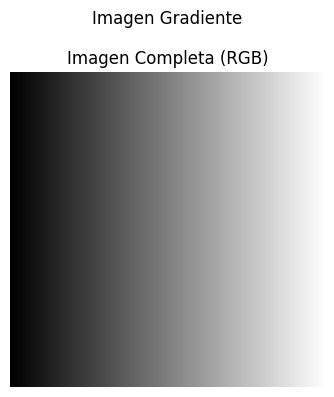

In [28]:
# Creá una imagen sintética simple (ej: gradiente o patrón)
# Probá tus funciones con esta imagen
grad = np.tile(np.linspace(0, 255, 400, dtype=np.uint8), (400,1))
img_sintetica = Image.fromarray(np.stack([grad, grad, grad], axis=2))
carpeta = "/content/mis_imagenes"
os.makedirs(carpeta, exist_ok=True)
ruta_salida = os.path.join(carpeta, "imagen_gradiente.jpg")
img_sintetica.save(ruta_salida)

imagen1 = cargar_imagen('/content/mis_imagenes/imagen_gradiente.jpg')
mostrar_info_imagen(imagen1, "Imagen Gradiente")

---

# PARTE 3: Análisis de Tu Dataset

Ahora vas a trabajar con tu dataset de 3 documentos. Esta parte es clave para entender qué problemas tenés que resolver.

**Preparación del Dataset:**
- Creá una carpeta llamada `dataset/` en la misma ubicación que este notebook
- Incluí exactamente 3 imágenes de documentos:
  1. Una de buena calidad (bien iluminada, recta)
  2. Una rotada o inclinada
  3. Una con problemas (oscura, borrosa, o con sombras)

## 3.1 Carga de las Imágenes

**Material de consulta:** `002/TEO/LeerImagenColor.ipynb`

In [29]:
# Define las rutas a tus 3 imágenes
rutas_imagenes = [
    "dataset/imagen1.jpg",  # Buena calidad
    "dataset/imagen2.jpg",  # Rotada
    "dataset/imagen3.jpg"   # Con problemas
]

# Carga las 3 imágenes usando tu función
imagenes = []
nombres = ["Buena Calidad", "Rotada", "Con Problemas"]

# Tu código aquí
for ruta in rutas_imagenes:
    img = cargar_imagen(ruta, target_size=(400, 400))  # Ajusta tamaño si querés
    if img is not None:
        imagenes.append(img)

## 3.2 Inspección Visual y Análisis

**Material de consulta:** `002/Fundamentos_Imagen_Digital.ipynb`

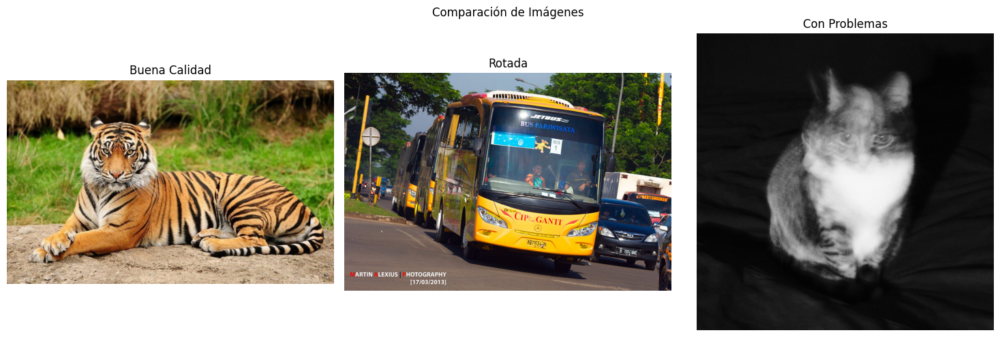

In [30]:
# Mostra las 3 imágenes lado a lado con sus nombres
# Usa subplots de matplotlib

# Tu código aquí

# Mostrar imágenes en una fila
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for i in range(3):
    axes[i].imshow(imagenes[i])
    axes[i].set_title(nombres[i])
    axes[i].axis('off')

plt.suptitle("Comparación de Imágenes")
plt.tight_layout()
plt.show()

--- Imagen ---
Dimensiones: (638, 1024, 3)
Tipo de dato: uint8
Rango de valores: 0 a 255
media: 115.57000789821709
desviación estándar: 63.77565488400571


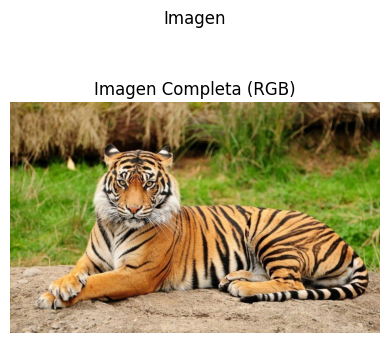

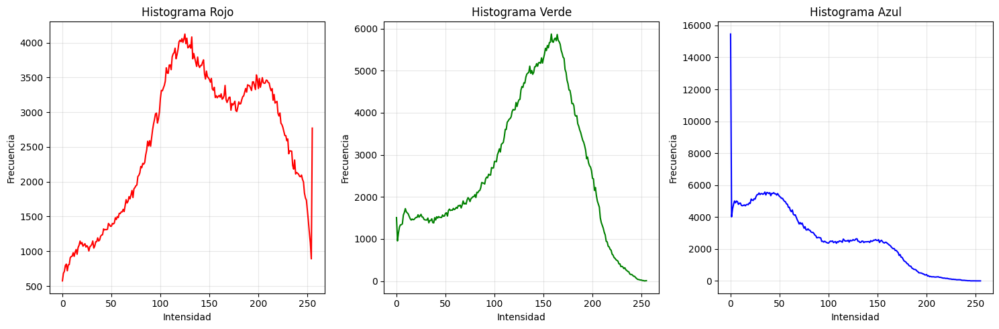

--- Imagen ---
Dimensiones: (427, 640, 3)
Tipo de dato: uint8
Rango de valores: 0 a 255
media: 85.74140929937549
desviación estándar: 62.97568201626992


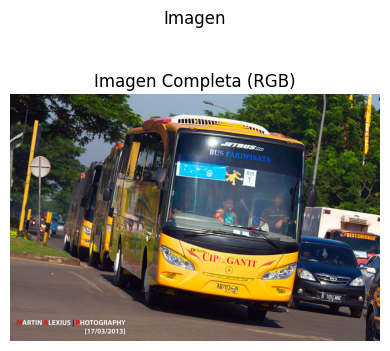

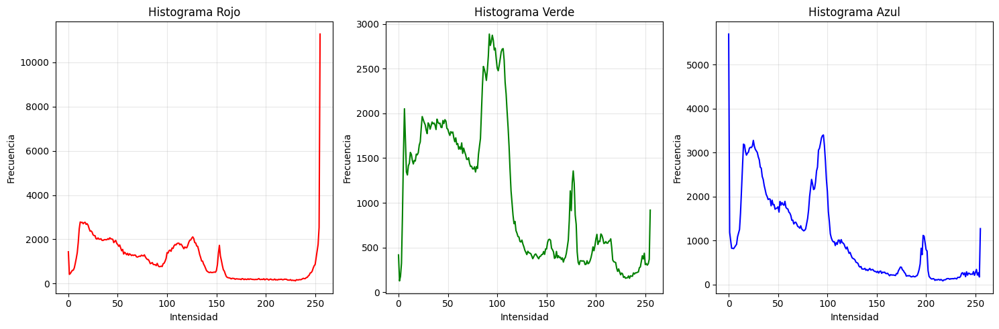

--- Imagen ---
Dimensiones: (2950, 2950, 3)
Tipo de dato: uint8
Rango de valores: 0 a 255
media: 47.26548577994829
desviación estándar: 64.68661684704345


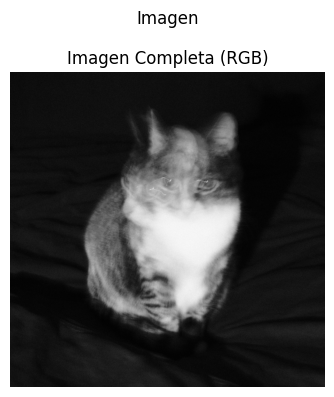

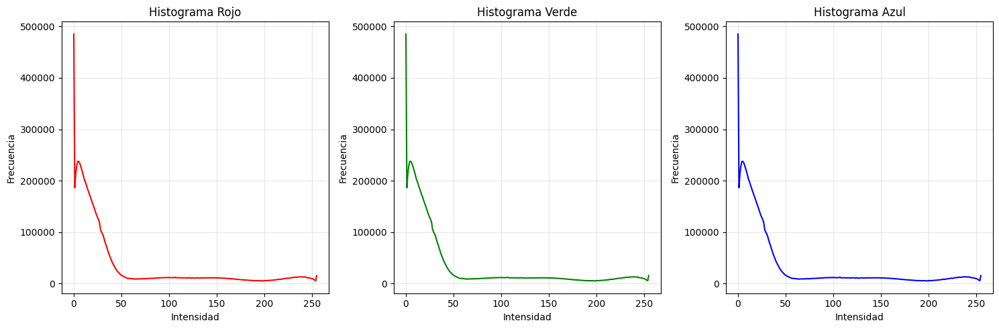

In [55]:
# Para cada imagen, mostrá información básica y un histograma

for i in imagenes:
  mostrar_info_imagen(i)

  # Análisis de histograma de color
  plt.figure(figsize=(15, 5))

  # color imagen
  if len(i.shape) == 3:
      canales = ['Rojo', 'Verde', 'Azul']
      colores = ['red', 'green', 'blue']

      for j in range(3):
          plt.subplot(1, 3, j+1)
          histograma = cv2.calcHist([i], [j], None, [256], [0, 256])
          plt.plot(histograma, color=colores[j])
          plt.title(f'Histograma {canales[j]}')
          plt.xlabel('Intensidad')
          plt.ylabel('Frecuencia')
          plt.grid(True, alpha=0.3)

  plt.tight_layout()
  plt.show()

## 3.3 Identificación de Problemas

Basándote en tu inspección visual, identificá los problemas principales de cada imagen:

**Imagen 1 (Buena Calidad):**
- Problemas identificados: Se observa que los canales rojo y verde están bien distribuidos en el medio, mientras que el azul se concentra en baja intensidad.
- Preprocessing necesario: Aumento de contraste.

**Imagen 2 (Rotada):**
- Problemas identificados: Existe una distribución irregular en los canales verde y azul, mientras que el rojo tiene una intensidad alta llegando a los 250.
- Preprocessing necesario: Se va a rotar la imagen y aplicar una ecualización.

**Imagen 3 (Con Problemas):**
- Problemas identificados: La imagen es muy oscura, está blureada y tiene poco rango dinámico.
- Preprocessing necesario: Se va realizar una ecualización y un aumento del brillo.

---

# PARTE 4: Preprocessing Básico

Ahora vas a aplicar técnicas de preprocessing para mejorar cada imagen. Trabajá con una imagen por vez.

## 4.1 Segmentación Básica

Separar el documento del fondo es el primer paso crítico.

**Material de consulta:** `Segmentacion.ipynb` (especialmente las funciones de umbralización)

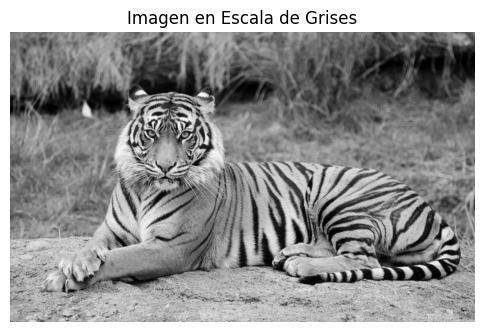

In [7]:
# Elegí UNA de tus imágenes para trabajar primero
imagen_trabajo = imagenes[0]  # Cambiá el índice según necesites

# Convertí a escala de grises
# Tu código aquí
imagen_trabajo_buena = imagenes[0]  # Cambiá el índice según necesites

# Convertir a escala de grises
# Si la imagen está en RGB (matplotlib), OpenCV espera BGR, pero podemos usar cvtColor igual
imagen_gray_0 = cv2.cvtColor(imagen_trabajo_buena, cv2.COLOR_RGB2GRAY)

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(imagen_gray_0, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')
plt.show()

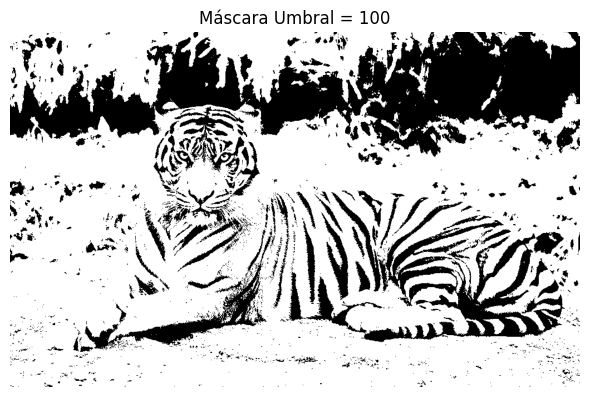

In [8]:
# Aplicá segmentación por umbralización
# Probá diferentes valores hasta encontrar el mejor


# Aplicar umbral fijo = 100
umbral = 100
_, imagen_bin_0 = cv2.threshold(imagen_gray_0, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(6,6))

plt.subplot(1,1,1)
plt.imshow(imagen_bin_0, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')


plt.tight_layout()
plt.show()

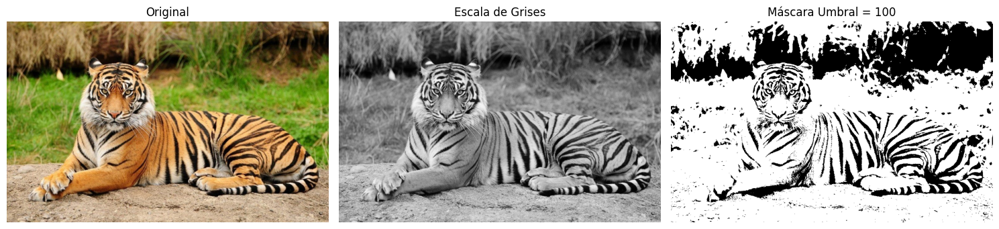

In [9]:
# Mostrá el resultado: original, escala de grises, y máscara
# Tu código aquí
# Mostrá el resultado: original, escala de grises, y máscara

# Aplicar umbral fijo = 100
umbral = 100
_, imagen_bin_0 = cv2.threshold(imagen_gray_0, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(imagenes[0])
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imagen_bin_0, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')

plt.tight_layout()
plt.show()

## 4.2 Mejora de Calidad

**Material de consulta:** `Mejora_Imagen_Ecualizacion.ipynb`

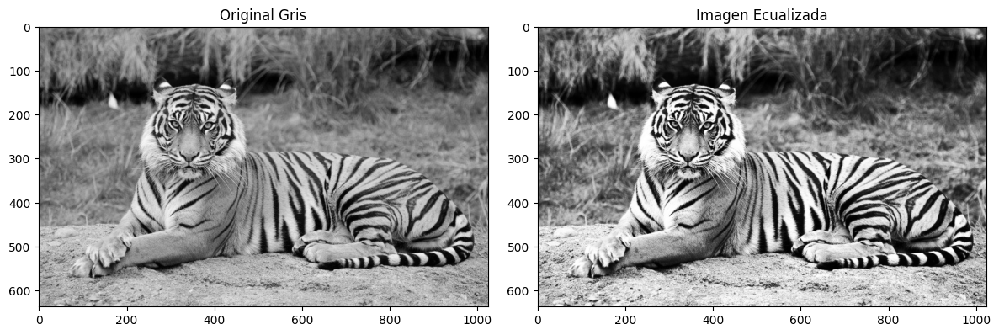

In [10]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización
imagen_ecualizada_buena = cv2.equalizeHist(imagen_gray_0)

ecualizar_bueno = cv2.cvtColor(imagenes[0], cv2.COLOR_RGB2HSV)
ecualizar_bueno[:, :, 2] = cv2.equalizeHist(ecualizar_bueno[:, :, 2])
imagen_buena_ecualizada = cv2.cvtColor(ecualizar_bueno, cv2.COLOR_HSV2RGB)

# Mostrar resultados
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Escala de Grises")


plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_buena, cmap='gray')
plt.title("Imagen Ecualizada")


plt.tight_layout()
plt.show()

## 4.4 Aplicación a las Otras Imágenes

Repetí el proceso para tus otras 2 imágenes, adaptando las técnicas según los problemas específicos de cada una:

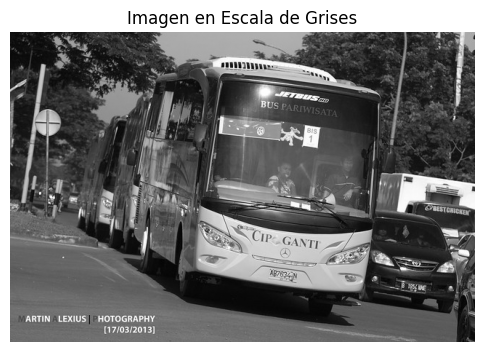

In [11]:
# Si tu imagen está rotada, aplicá corrección básica
# Material de consulta: Transformaciones_Geometricas.ipynb

imagen_trabajo_rotada = imagenes[1]  # Cambiá el índice según necesites

# Convertir a escala de grises
# Si la imagen está en RGB (matplotlib), OpenCV espera BGR, pero podemos usar cvtColor igual
imagen_gray_0 = cv2.cvtColor(imagen_trabajo_rotada, cv2.COLOR_RGB2GRAY)

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(imagen_gray_0, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')
plt.show()

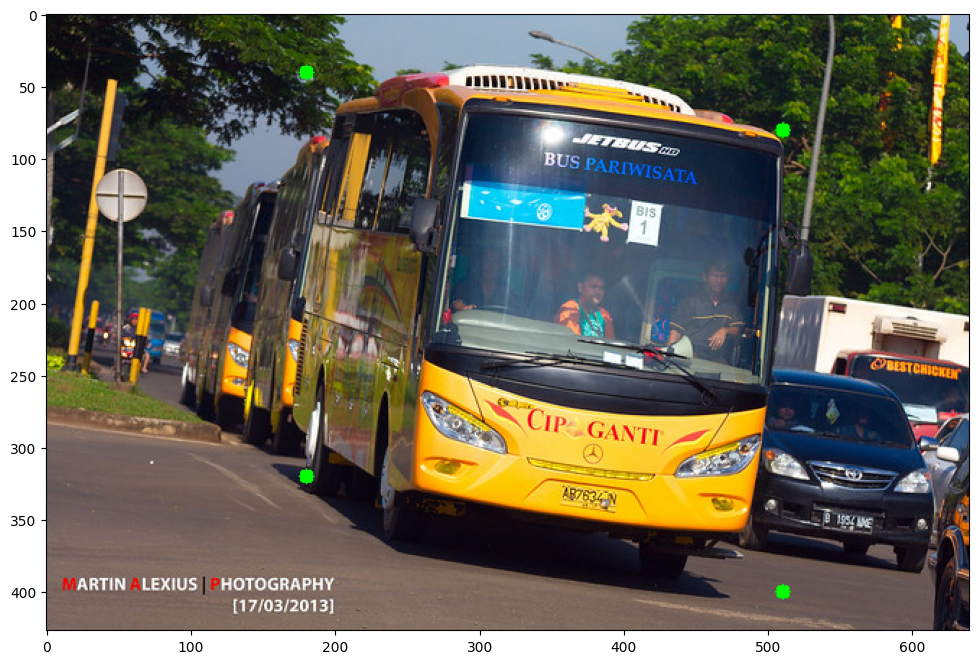

In [40]:
# Primero coordenada x, despues coordenada y

imagen_trabajo_rotada_2 = imagen_trabajo_rotada.copy()

corners = [(180, 40), # Superior izquierdo
           (510, 80), # Superior derecho
           (180, 320), # Inferior izquierdo
           (510,  400) # Inferior derecho
          ]

for x, y in corners:
    cv2.circle(imagen_trabajo_rotada_2, (x,y), radius=0, color=(0, 255, 0), thickness=6)
plt.imshow(imagen_trabajo_rotada_2);

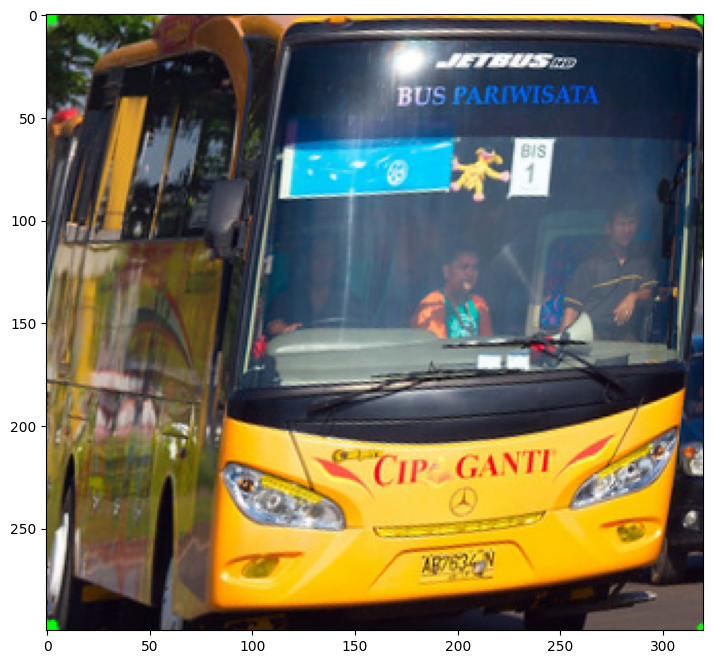

In [41]:
w, h = 320, 300
pts1 = np.float32(corners)

# Para los puntos de destino, debe preservarse el orden de los puntos originales
pts2 = np.float32([[0, 0], [w, 0], [0, h], [w, h]])

# Obtenemos la matriz de cambio de perspectiva
matrix = cv2.getPerspectiveTransform(pts1, pts2)

# Y la aplicamos con warpPerspective
# El segundo parametro es esta matriz y el tercero debe ser una tupla con especificando (ancho, alto)
imagen_rotada_output = cv2.warpPerspective(imagen_trabajo_rotada_2, matrix, (w, h))
plt.imshow(imagen_rotada_output)

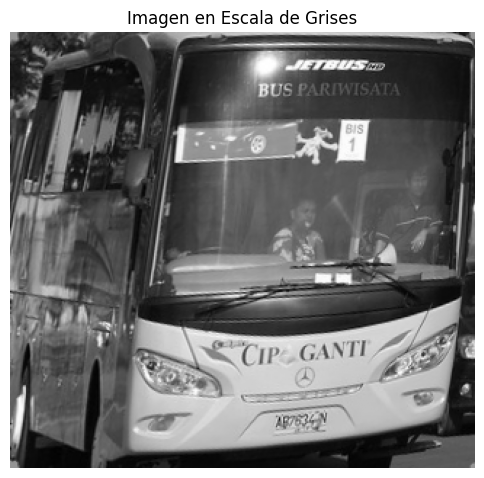

In [42]:
# Convertir a escala de grises
# Si la imagen está en RGB (matplotlib), OpenCV espera BGR, pero podemos usar cvtColor igual
imagen_gray_0 = cv2.cvtColor(imagen_rotada_output, cv2.COLOR_RGB2GRAY)

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(imagen_gray_0, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')
plt.show()

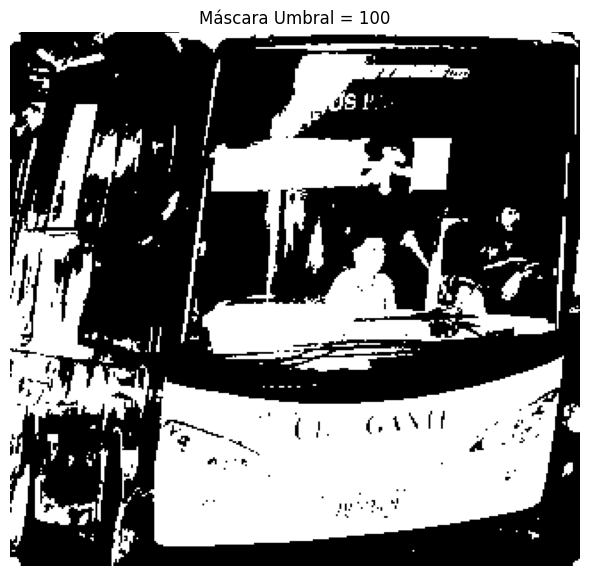

In [43]:
# Aplicá segmentación por umbralización
# Probá diferentes valores hasta encontrar el mejor

# Aplicar umbral fijo
umbral = 100
_, imagen_bin_0 = cv2.threshold(imagen_gray_0, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(6,6))

plt.subplot(1,1,1)
plt.imshow(imagen_bin_0, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')


plt.tight_layout()
plt.show()

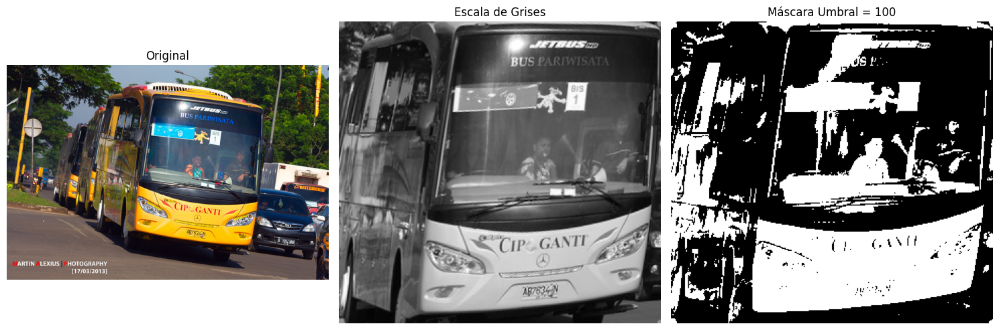

In [44]:
# Mostrá el resultado: original, escala de grises, y máscara


# Aplicar umbral fijo = 100
umbral = 100
_, imagen_bin_0 = cv2.threshold(imagen_gray_0, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(imagenes[1])
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imagen_bin_0, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')

plt.tight_layout()
plt.show()

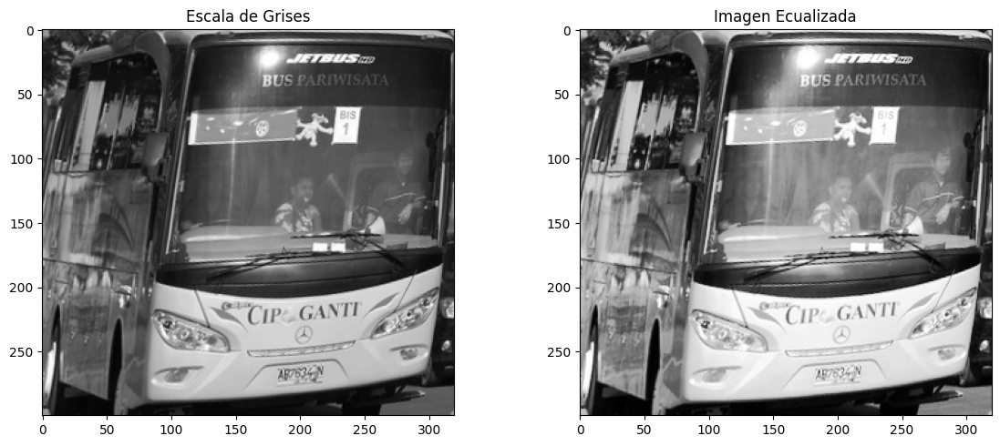

In [50]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización
imagen_ecualizada_rotada = cv2.equalizeHist(imagen_gray_0)

ecualizar_rotada = cv2.cvtColor(imagen_rotada_output, cv2.COLOR_RGB2HSV)
ecualizar_rotada[:, :, 2] = cv2.equalizeHist(ecualizar_rotada[:, :, 2])
imagen_rotada_ecualizada = cv2.cvtColor(ecualizar_rotada, cv2.COLOR_HSV2RGB)

# Mostrar resultados
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Escala de Grises")


plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_rotada, cmap='gray')
plt.title("Imagen Ecualizada")


plt.tight_layout()
plt.show()

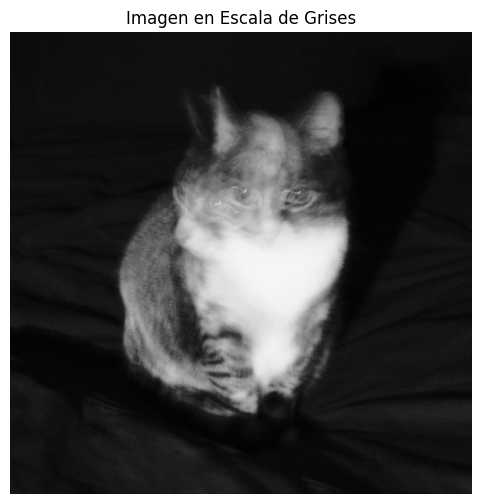

In [18]:
# Elegí UNA de tus imágenes para trabajar primero
imagen_trabajo = imagenes[2]  # Cambiá el índice según necesites

# Convertí a escala de grises
# Tu código aquí
imagen_trabajo_problema = imagenes[2]  # Cambiá el índice según necesites

# Convertir a escala de grises
# Si la imagen está en RGB (matplotlib), OpenCV espera BGR, pero podemos usar cvtColor igual
imagen_gray_0 = cv2.cvtColor(imagen_trabajo_problema, cv2.COLOR_RGB2GRAY)

# Mostrar la imagen en escala de grises
plt.figure(figsize=(6,6))
plt.imshow(imagen_gray_0, cmap='gray')
plt.title('Imagen en Escala de Grises')
plt.axis('off')
plt.show()

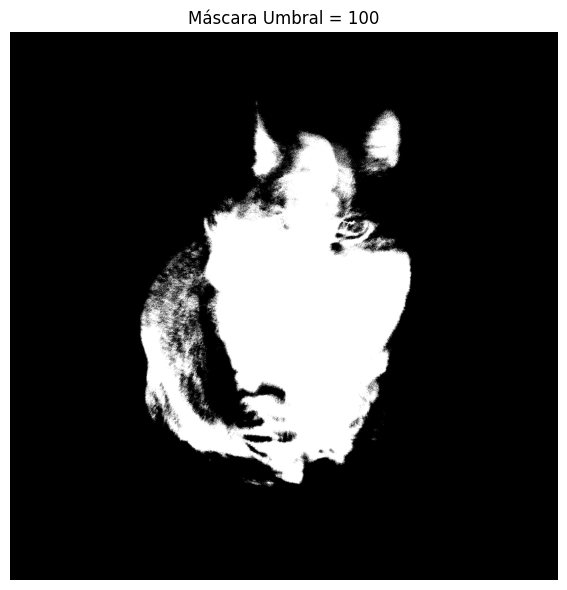

In [19]:
# Aplicá segmentación por umbralización
# Probá diferentes valores hasta encontrar el mejor


# Aplicar umbral fijo = 100
umbral = 100
_, imagen_bin_0 = cv2.threshold(imagen_gray_0, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(6,6))

plt.subplot(1,1,1)
plt.imshow(imagen_bin_0, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')


plt.tight_layout()
plt.show()

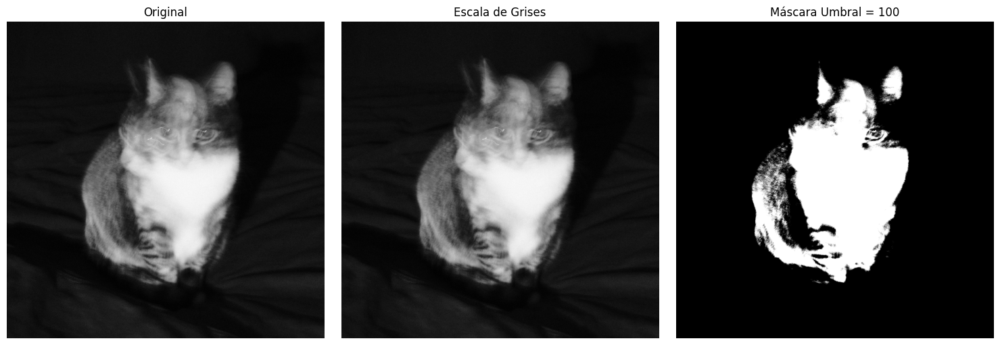

In [20]:
# Mostrá el resultado: original, escala de grises, y máscara
# Tu código aquí
# Mostrá el resultado: original, escala de grises, y máscara

# Aplicar umbral fijo = 100
umbral = 100
_, imagen_bin_0 = cv2.threshold(imagen_gray_0, umbral, 255, cv2.THRESH_BINARY)

# Mostrar resultados lado a lado
plt.figure(figsize=(15,5))

plt.subplot(1,3,1)
plt.imshow(imagenes[2])
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Escala de Grises")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(imagen_bin_0, cmap='gray')
plt.title(f"Máscara Umbral = {umbral}")
plt.axis('off')

plt.tight_layout()
plt.show()

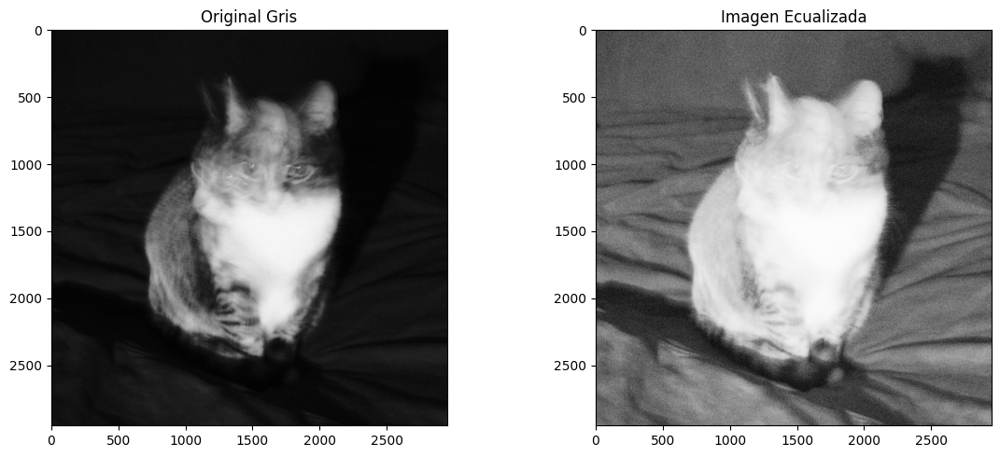

In [21]:
# Si tu imagen tiene problemas de contraste, aplicá ecualización
imagen_ecualizada_problema = cv2.equalizeHist(imagen_gray_0)

ecualizar_problema = cv2.cvtColor(imagenes[2], cv2.COLOR_RGB2HSV)
ecualizar_problema[:, :, 2] = cv2.equalizeHist(ecualizar_problema[:, :, 2])
imagen_problema_ecualizada = cv2.cvtColor(ecualizar_problema, cv2.COLOR_HSV2RGB)

# Mostrar resultados
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.imshow(imagen_gray_0, cmap='gray')
plt.title("Escala de Grises")


plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_problema, cmap='gray')
plt.title("Imagen Ecualizada")


plt.tight_layout()
plt.show()

## 4.3 Comparación de Resultados

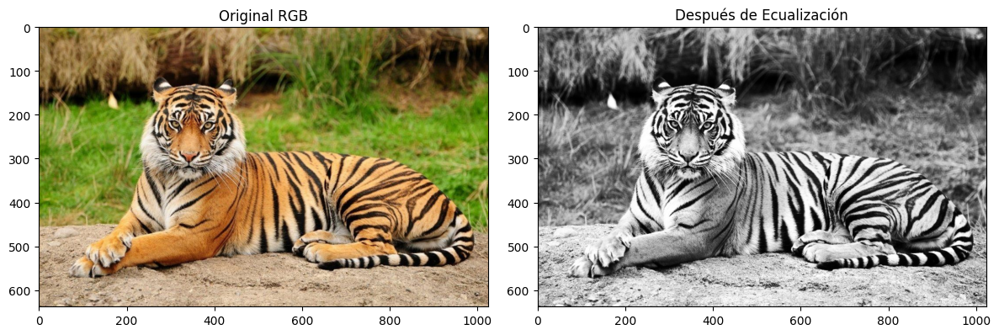

In [22]:
# Mostrá lado a lado: imagen original vs imagen procesada

plt.figure(figsize=(12,5))

# Imagen original a color
plt.subplot(1,2,1)
plt.imshow(imagenes[0])
plt.title("Original RGB")

# Imagen normalizada a color
plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_buena,  cmap='gray')
plt.title("Después de Ecualización")

plt.tight_layout()
plt.show()

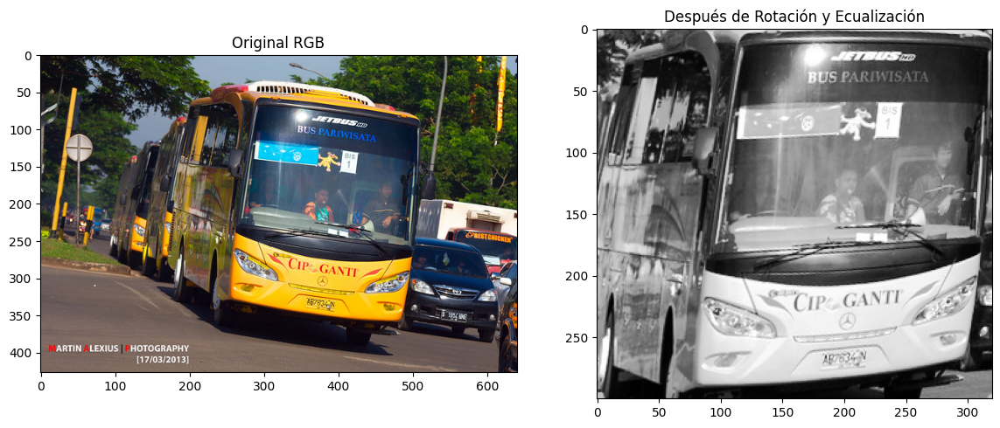

In [46]:
# Procesamiento de la segunda imagen

plt.figure(figsize=(12,5))

# Imagen original a color
plt.subplot(1,2,1)
plt.imshow(imagenes[1])
plt.title("Original RGB")

# Imagen normalizada a color
plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_rotada,  cmap='gray')
plt.title("Después de Rotación y Ecualización")

plt.tight_layout()
plt.show()

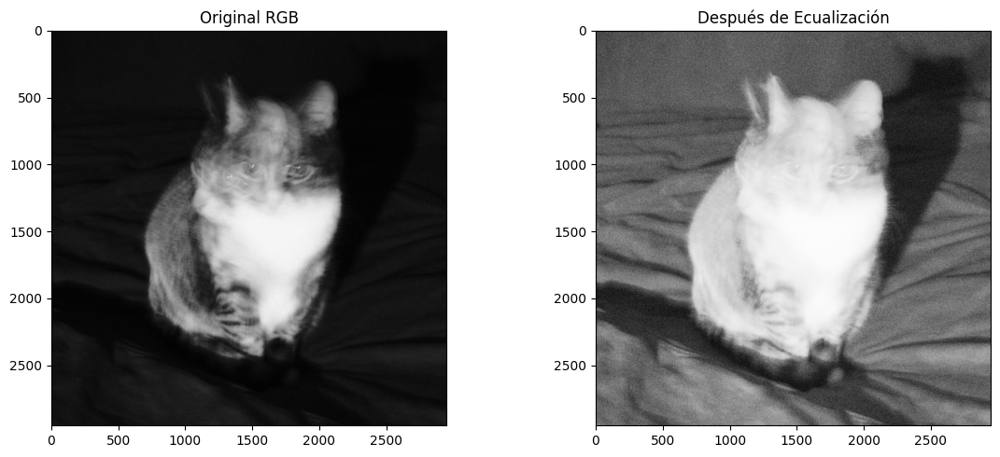

In [24]:
# Procesamiento de la tercera imagen

plt.figure(figsize=(12,5))

# Imagen original a color
plt.subplot(1,2,1)
plt.imshow(imagenes[2])
plt.title("Original RGB")

# Imagen normalizada a color
plt.subplot(1,2,2)
plt.imshow(imagen_ecualizada_problema,  cmap='gray')
plt.title("Después de Ecualización")

plt.tight_layout()
plt.show()

## 4.5 Resultados Finales

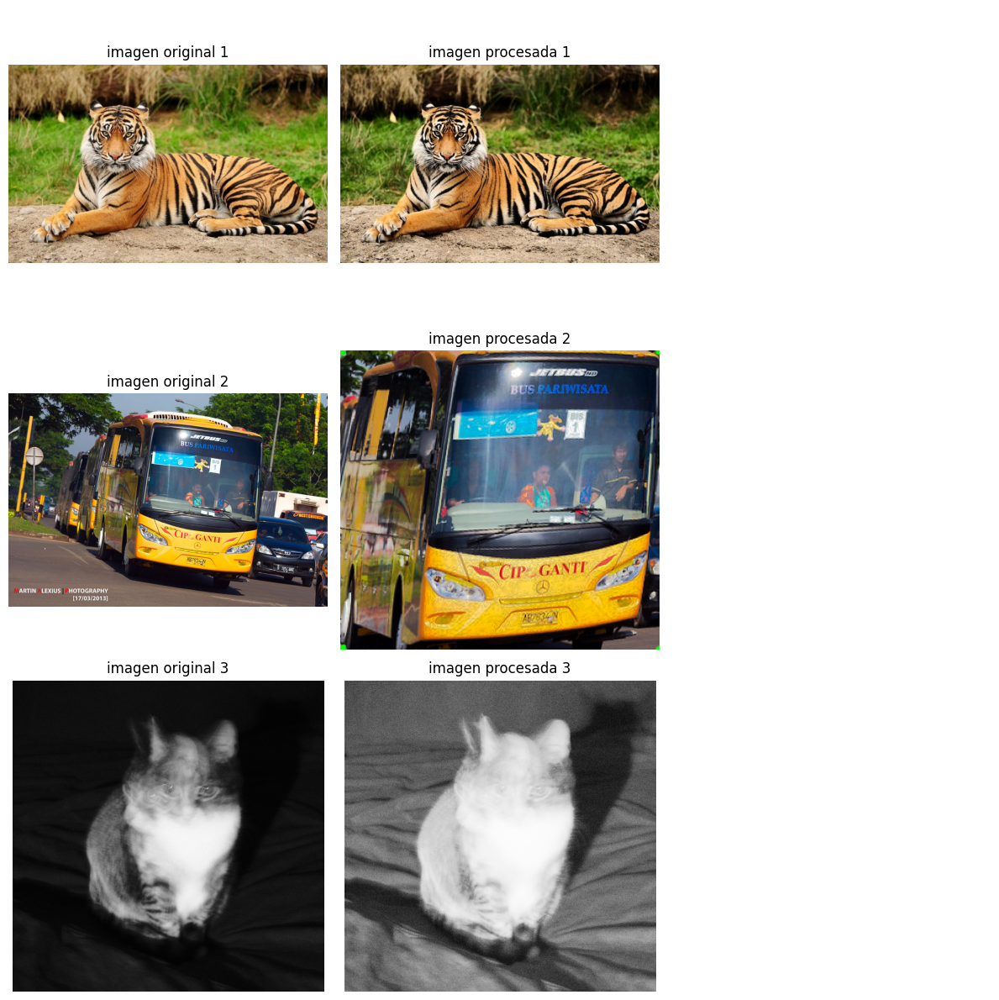

In [51]:
# Creá un grid mostrando las 3 imágenes originales y las 3 procesadas

# Cargar las imágenes (reemplaza con tus rutas de imágenes)
dataset_images = [imagenes[0],imagenes[1],imagenes[2]]
output_images = [imagen_buena_ecualizada, imagen_rotada_ecualizada, imagen_problema_ecualizada]

# Crear la figura y los subgráficos (3x3 grid)
fig, axes = plt.subplots(3, 3, figsize=(12, 12))

# Iterar sobre el grid de subgráficos y cargar las imágenes correspondientes
for i in range(3):
    # Get the image from the dataset and the output for each row
    img_dataset = dataset_images[i]
    img_output = output_images[i]

    # Mostrar imagen original
    axes[i, 0].imshow(img_dataset)
    axes[i, 0].set_title(f'imagen original {i+1}', fontsize=12)
    axes[i, 0].axis('off')

    # Mostrar imagen procesada
    axes[i, 1].imshow(img_output, cmap='gray')
    axes[i, 1].set_title(f'imagen procesada {i+1}', fontsize=12)
    axes[i, 1].axis('off')

    # Dejar tercera columna vacía
    axes[i, 2].axis('off')
# Ajustar el layout para that everything looks good
plt.tight_layout()
plt.show()

---

# REFLEXIÓN FINAL

## Análisis de Resultados

**¿Qué técnica fue más efectiva para cada tipo de problema?**

En la segunda imagen, se aplica rotación y ecualización, se logra apreciar las 3 personas dentro del micro en la imagen en escala de grises, en la imagen original solo se veía uno bien y el conductor en parte.

**¿Qué desafíos encontraste durante el procesamiento?**

Al momento de rotar la imagen 2, la selección de puntos fue a ojo, esto tal vez pueda remplazarse por algún algoritmo de detección de objetos.

**¿En qué casos los resultados no fueron óptimos y por qué?**

En la tercer imagen, se pierde un poco la definición del gato pero se logra ver el fondo de la imagen. El motivo es por los problemas de blureado y el poco rango dinámico.

## Aprendizaje Adquirido

**¿Qué conceptos del curso fueron más útiles?**



**¿Cómo podrías mejorar este sistema en futuras versiones?**

Aplicando modularización para las funciones, algoritmos de reconocimiento de objetos para poder trabajar mas sobre lo que quiero resaltar en la imagen.

---

## Entregables

1. Este notebook completamente ejecutado con resultados
2. Carpeta `dataset/` con tus 3 imágenes
3. Las reflexiones completadas

**Fecha de entrega:** 24 de Septiembre, 23:59

---